# Visualize Predictions

## Parameters

In [2]:
import torch

# set random seeds
torch.manual_seed(0)

In [3]:
config = '/home/Talen/foragefish_classifier/configs/exp_resnet18.yaml'
split = 'test'

## Load Data

In [4]:
import sys
sys.path.append('/home/Talen/foragefish_classifier')


In [5]:
import yaml
from train import create_dataloader, load_model       # NOTE: since we're using these functions across files, it could make sense to put them in e.g. a "util.py" script.

# load config
print(f'Using config "{config}"')
cfg = yaml.safe_load(open(config, 'r'))


# setup entities
dl_test = create_dataloader(cfg, split='train')

Using config "/home/Talen/foragefish_classifier/configs/exp_resnet18.yaml"


## Visualize

This is up to you to figure out now. :)

In [6]:
import matplotlib.pyplot as plt

def visualize_batch(images, labels, nrows=1, ncols=4, figsize=(15,8)):
    """
    Visualize a batch of images with their labels
    Args:
        images: torch tensor of shape (batch_size, channels, height, width)
        labels: ground truth labels
        nrows: number of rows in grid
        ncols: number of columns in grid
    """
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.ravel()
    
    n_images = min(len(images), nrows * ncols)
    
    for idx in range(n_images):
        # Convert tensor to numpy and transpose to (H,W,C)
        img = images[idx].permute(1,2,0).cpu().numpy()
        
        # Normalize image for better visualization
        img = (img - img.min()) / (img.max() - img.min())
        
        # Plot image and label
        axes[idx].imshow(img)
        axes[idx].set_title(f'Label: {labels[idx]}')
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

  0%|          | 0/34 [00:00<?, ?it/s]

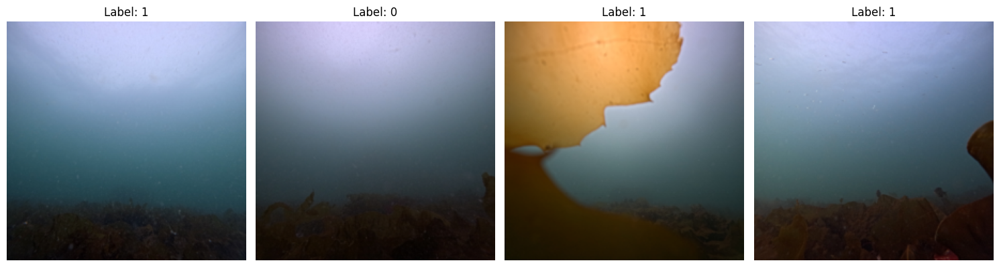

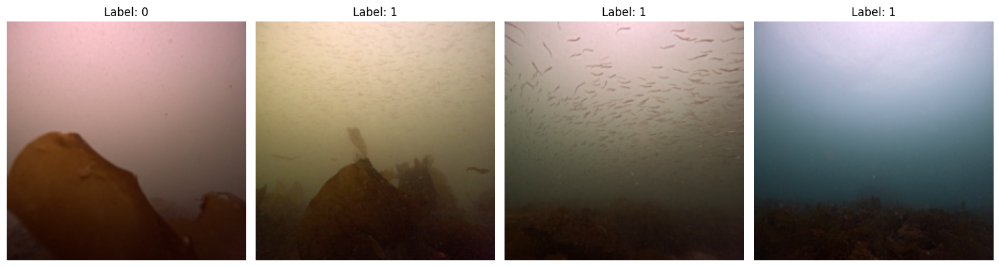

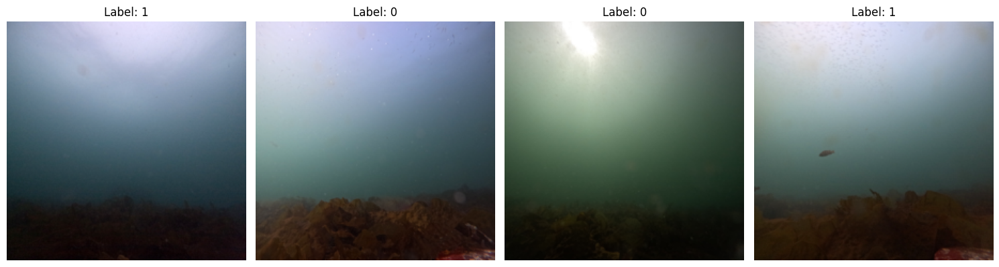

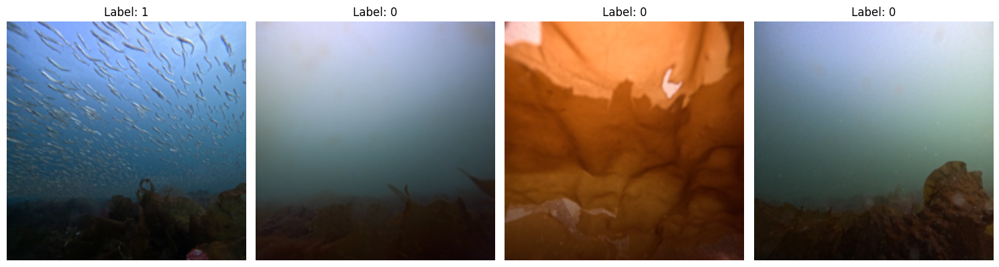

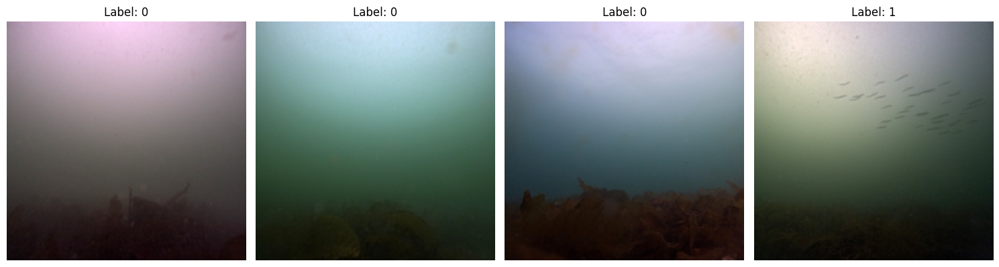

...

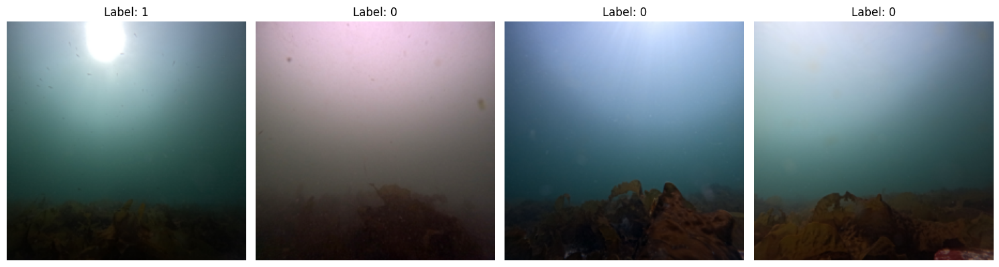

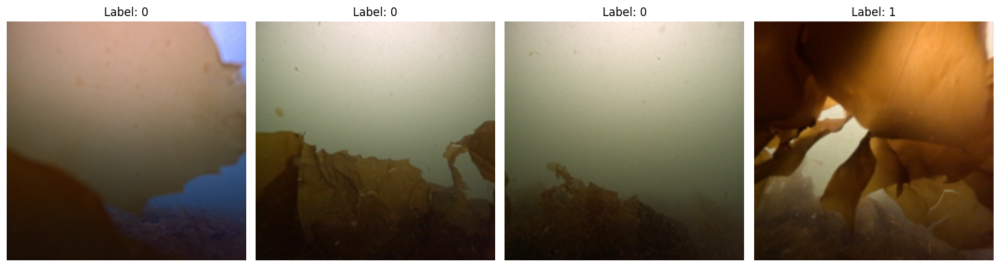

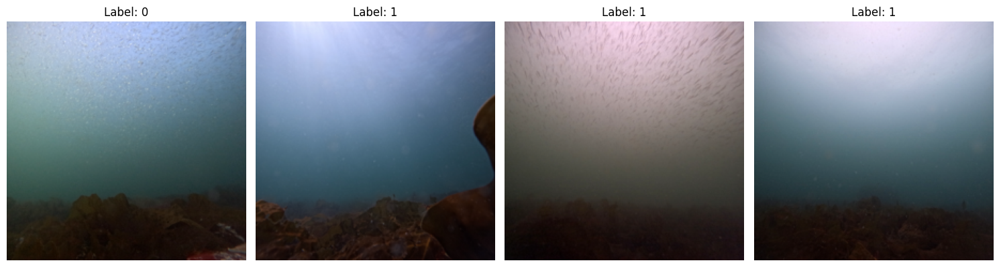

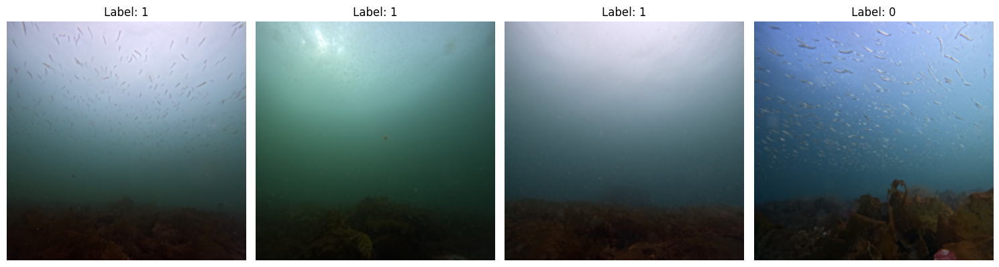

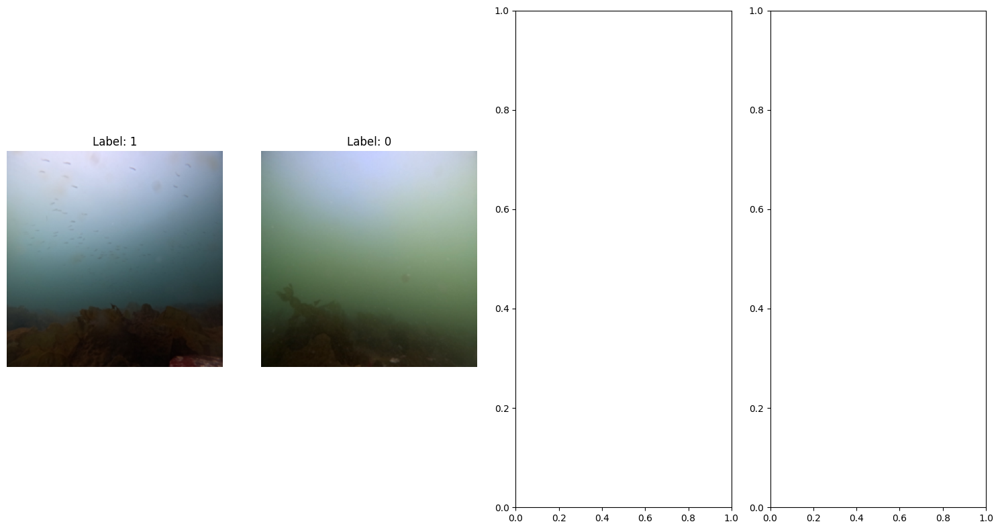

In [7]:
from tqdm import trange
import matplotlib.pyplot as plt
import numpy as np

device = "cuda"
progressBar = trange(len(dl_test))

for idx, (data, labels) in enumerate(dl_test):       # see the last line of file "dataset.py" where we return the image tensor (data) and label

    # put data and labels on device
    # data, labels = data.to(device), labels.to(device)

    # visualize data using matplotlib (below is the code, use it but when don't use it when syncing to github)
    visualize_batch(data, labels)
    

    
